In [58]:
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture 
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.decomposition import FastICA
from sklearn.ensemble.forest import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import silhouette_score
from sklearn.random_projection import GaussianRandomProjection


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


%matplotlib inline

In [26]:
data=pd.read_csv("../input/sgemm/sgemm_product.csv")
data.head()
#take average of 4 run
data["run_avg"]=np.mean(data.iloc[:,14:18],axis=1)

mean_run=np.mean(data["run_avg"])
print(mean_run)

#Binary Classification run_avg>mean_run
data["run_class"]=np.where(data['run_avg']>=mean_run, 1, 0)
data.groupby("run_class").size()

data.describe()

217.571953093958


,MWG,NWG,KWG,MDIMC,NDIMC,MDIMA,NDIMB,KWI,VWM,VWN,STRM,STRN,SA,SB,Run1 (ms),Run2 (ms),Run3 (ms),Run4 (ms),run_avg,run_class
count,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000,241600.000000
mean,80.415364,80.415364,25.513113,13.935894,13.935894,17.371126,17.371126,5.000000,2.448609,2.448609,0.500000,0.500000,0.500000,0.500000,217.647852,217.579536,217.532756,217.527669,217.571953,0.261370
std,42.469220,42.469220,7.855619,7.873662,7.873662,9.389418,9.389418,3.000006,1.953759,1.953759,0.500001,0.500001,0.500001,0.500001,369.012422,368.677309,368.655118,368.677413,368.750161,0.439382
min,16.000000,16.000000,16.000000,8.000000,8.000000,8.000000,8.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,13.290000,13.250000,13.360000,13.370000,13.317500,0.000000
25%,32.000000,32.000000,16.000000,8.000000,8.000000,8.000000,8.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,40.660000,40.710000,40.660000,40.640000,40.667500,0.000000
50%,64.000000,64.000000,32.000000,8.000000,8.000000,16.000000,16.000000,5.000000,2.000000,2.000000,0.500000,0.500000,0.500000,0.500000,69.825000,69.930000,69.790000,69.820000,69.790000,0.000000
75%,128.000000,128.000000,32.000000,16.000000,16.000000,32.000000,32.000000,8.000000,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,228.530000,228.310000,228.320000,228.320000,228.387500,1.000000
max,128.000000,128.000000,32.000000,32.000000,32.000000,32.000000,32.000000,8.000000,8.000000,8.000000,1.000000,1.000000,1.000000,1.000000,3339.630000,3375.420000,3397.080000,3361.710000,3341.507500,1.000000


In [27]:
sgemm_df=data.drop(columns=['Run1 (ms)','Run2 (ms)','Run3 (ms)','Run4 (ms)','run_avg'])
sgemm_df.to_csv(r'segmm_product_classification.csv')
sgemm_df.head()

,MWG,NWG,KWG,MDIMC,NDIMC,MDIMA,NDIMB,KWI,VWM,VWN,STRM,STRN,SA,SB,run_class
0,16,16,16,8,8,8,8,2,1,1,0,0,0,0,0
1,16,16,16,8,8,8,8,2,1,1,0,0,0,1,0
2,16,16,16,8,8,8,8,2,1,1,0,0,1,0,0
3,16,16,16,8,8,8,8,2,1,1,0,0,1,1,0
4,16,16,16,8,8,8,8,2,1,1,0,1,0,0,0


In [28]:
#data info
sgemm_df.info()
#No null values in the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241600 entries, 0 to 241599
Data columns (total 15 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   MWG        241600 non-null  int64
 1   NWG        241600 non-null  int64
 2   KWG        241600 non-null  int64
 3   MDIMC      241600 non-null  int64
 4   NDIMC      241600 non-null  int64
 5   MDIMA      241600 non-null  int64
 6   NDIMB      241600 non-null  int64
 7   KWI        241600 non-null  int64
 8   VWM        241600 non-null  int64
 9   VWN        241600 non-null  int64
 10  STRM       241600 non-null  int64
 11  STRN       241600 non-null  int64
 12  SA         241600 non-null  int64
 13  SB         241600 non-null  int64
 14  run_class  241600 non-null  int64
dtypes: int64(15)
memory usage: 27.6 MB


In [29]:
#checking for NULL values
sgemm_df.isnull().sum() #no NULL values



MWG          0
NWG          0
KWG          0
MDIMC        0
NDIMC        0
MDIMA        0
NDIMB        0
KWI          0
VWM          0
VWN          0
STRM         0
STRN         0
SA           0
SB           0
run_class    0
dtype: int64

In [30]:
df_test=sgemm_df.iloc[:,0:14]



/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


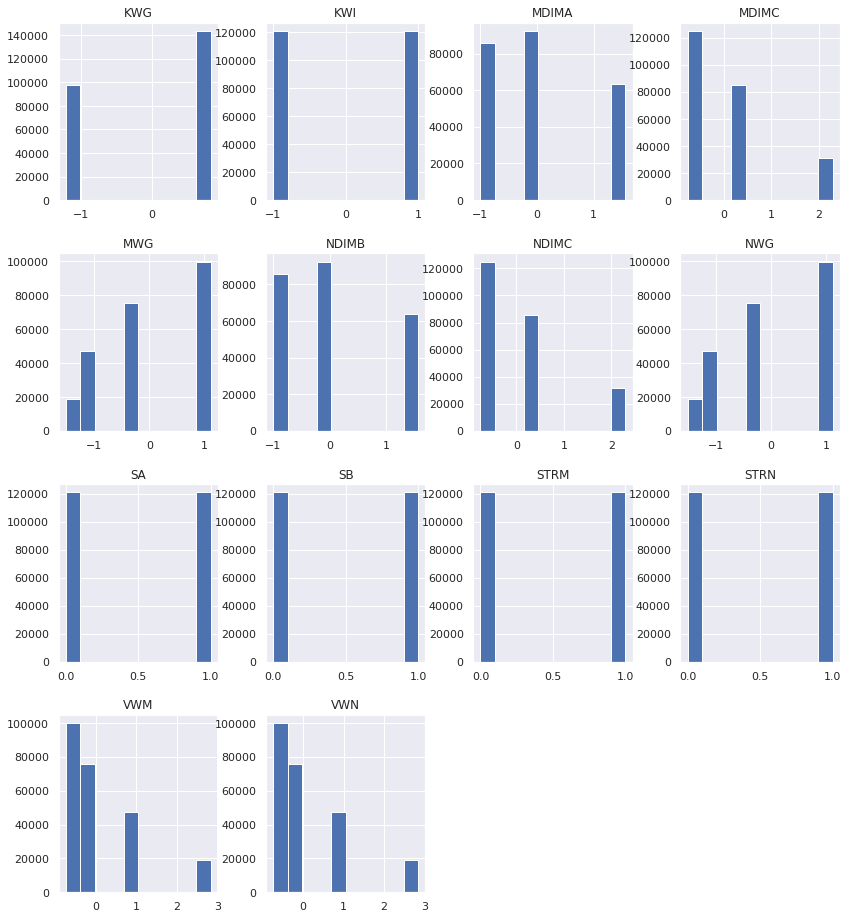

In [31]:
#checking variable distribution
for index in range(10):
    df_test.iloc[:,index] = (df_test.iloc[:,index]-df_test.iloc[:,index].mean()) / df_test.iloc[:,index].std();
df_test.hist(figsize= (14,16));

Text(0.5, 1, 'Variable Correlation')

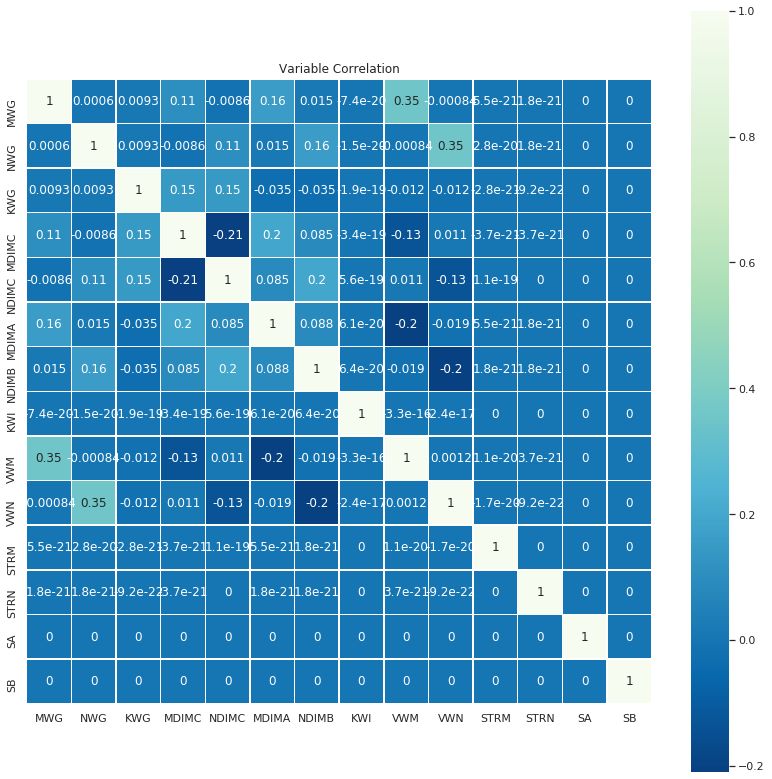

In [32]:
plt.figure(figsize=(14,14))
sns.set(font_scale=1)
sns.heatmap(df_test.corr(),cmap='GnBu_r',annot=True, square = True ,linewidths=.5);
plt.title('Variable Correlation')

In [33]:
#Varibale and predictor
y=np.array(sgemm_df["run_class"])

X=np.array(sgemm_df.iloc[:,0:14])




In [34]:
sc = StandardScaler()
cluster_data = sc.fit_transform(X)

cluster_data[:10]

array([[-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        , -1.        , -1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        , -1.        ,  1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        ,  1.        , -1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        , -1.        ,  1.        ,  1.        ],
       [-1.51675724, -1.51675724, -1.2109972 , -0.75389395, -0.75389395,
        -0.99805388, -0.99805388, -1.        , -0.74144862, -0.74144862,
        -1.        ,  1.  

In [35]:
def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

n_clusters=np.arange(2, 20)
sils=[]
sils_err=[]
iterations=20
for n in n_clusters:
    tmp_sil=[]
    for _ in range(iterations):
        gmm=GMM(n, n_init=2).fit(X) 
        labels=gmm.predict(X)
        sil=silhouette_score(X, labels, metric='euclidean')
        tmp_sil.append(sil)
    val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
    err=np.std(tmp_sil)
    sils.append(val)
    sils_err.append(err)

plt.errorbar(n_clusters, sils, yerr=sils_err)
plt.title("Silhouette Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("Score")

n_clusters=np.arange(2, 20)
bics=[]
bics_err=[]
iterations=20
for n in n_clusters:
    tmp_bic=[]
    for _ in range(iterations):
        gmm=GMM(n, n_init=2).fit(X) 
        
        tmp_bic.append(gmm.bic(X))
    val=np.mean(SelBest(np.array(tmp_bic), int(iterations/5)))
    err=np.std(tmp_bic)
    bics.append(val)
    bics_err.append(err)

plt.errorbar(n_clusters,bics, yerr=bics_err, label='BIC')
plt.title("BIC Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("Score")
plt.legend()



plt.errorbar(n_clusters, np.gradient(bics), yerr=bics_err, label='BIC')
plt.title("Gradient of BIC Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("grad(BIC)")
plt.legend()



# Expectation maximization

In [36]:
# fit model
model = GaussianMixture(n_components=4,covariance_type='tied',random_state=42)
model.fit(X)
# predict latent values
yhat = model.predict(X)

In [37]:
s = silhouette_score(X, yhat)
print('Silhouette Score:', s)

Silhouette Score: 0.5296694030788465


# PCA - EM

[4.53639997e-01 4.52928645e-01 2.52855826e-02 2.10774165e-02
 1.72858772e-02 1.71234688e-02 8.64408260e-03 2.25738761e-03
 7.53872687e-04 7.52849140e-04 6.27052115e-05 6.27052115e-05
 6.27052115e-05 6.27052115e-05]


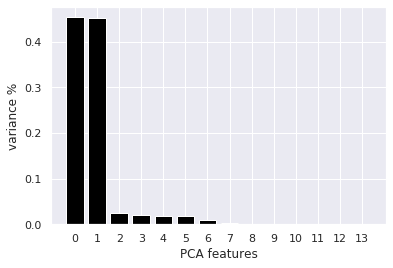

In [38]:
# Create a PCA instance: pca
pca = PCA(n_components=14)
principalComponents = pca.fit_transform(X)# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
print(pca.explained_variance_ratio_)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

Text(0, 0.5, 'PCA 2')

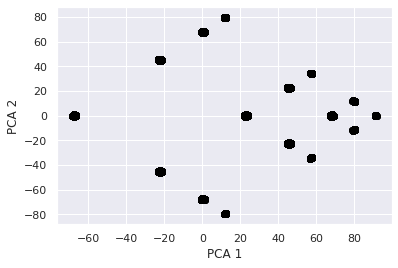

In [39]:
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='black')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

In [43]:
PCA_components.iloc[:,:3]

,0,1,2
0,91.747630,8.157135e-11,-11.494654
1,91.747630,6.183338e-11,-11.494654
2,91.747630,6.207046e-11,-11.494654
3,91.747630,6.211174e-11,-11.494654
4,91.747630,6.212052e-11,-11.494654
...,...,...,...
241595,-68.593443,-4.639109e-11,25.477561
241596,-68.593443,-4.639111e-11,25.477561
241597,-68.593443,-4.639110e-11,25.477561
241598,-68.593443,-4.639110e-11,25.477561


In [44]:
# fit model
model = GaussianMixture(n_components=4,covariance_type='tied',random_state=42)
model.fit(PCA_components.iloc[:,:3])
# predict latent values
yhat_pca = model.predict(PCA_components.iloc[:,:3])
yhat_prob_pca=model.predict_proba(PCA_components.iloc[:,:3])

In [45]:
s = silhouette_score(PCA_components.iloc[:,:3], yhat_pca)
print('Silhouette Score:', s)

Silhouette Score: 0.6394440586190562


In [46]:
import plotly.express as px
#df = px.data.iris()
fig = px.scatter_3d(PCA_components.iloc[:,:3], x=0, y=1, z=2,
            color=yhat_pca)
fig.show()

# Random Forest - EM

In [47]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [48]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
sel.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,

In [49]:
boolvec=sel.get_support()
boolvec.astype(bool)
boolvec

array([ True,  True, False,  True,  True, False, False, False, False,
       False, False, False, False, False])

In [50]:
input_file=sgemm_df.iloc[:,0:14]
#X_RF=input_file.loc[:, sel.get_support()]
#input_file=sgemm_df.loc[:, sel.get_support()].head()
selected_feat= input_file.columns[(sel.get_support())]
#selected_feat = np.where(boolvec[:,None], X_train,X_train)
len(selected_feat)

4

In [51]:
print(selected_feat)
#sgemm_df


Index(['MWG', 'NWG', 'MDIMC', 'NDIMC'], dtype='object')


In [52]:
X_RF=input_file.loc[:, sel.get_support()]


In [53]:
# fit model
model = GaussianMixture(n_components=4,covariance_type='tied',random_state=42)
model.fit(X_RF)
# predict latent values
yhat_rf = model.predict(X_RF)
yhat_prob_rf = model.predict(X_RF)

In [54]:
#labels=gmm.predict(X)
sil=silhouette_score(X_RF, yhat_rf, metric='euclidean')
print('Silhouette Score:', s)

Silhouette Score: 0.6394440586190562


# RCA

In [59]:
rca = GaussianRandomProjection(n_components=2, eps=0.1, random_state=42)
X_rca=rca.fit_transform(X)

In [60]:
# fit model
model = GaussianMixture(n_components=4,covariance_type='tied',random_state=42)
model.fit(X_rca)
# predict latent values
yhat_rca = model.predict(X_rca)
yhat_prob_rca = model.predict(X_rca)

In [61]:
#labels=gmm.predict(X)
sil=silhouette_score(X_rca, yhat_rca, metric='euclidean')
print('Silhouette Score:', s)

Silhouette Score: 0.6394440586190562


Text(0.5, 1.0, 'EM - RCA')

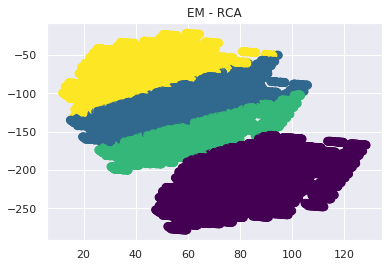

In [62]:
plt.scatter(X_rca[:, 0], X_rca[:, 1], c=yhat_rca, s=50, cmap='viridis')
plt.title('EM - RCA')

# ICA

In [63]:
ICA = FastICA(n_components=2, random_state=42) 
X_ica=ICA.fit_transform(X)



In [64]:
# fit model
model = GaussianMixture(n_components=4,covariance_type='tied',random_state=42)
model.fit(X_ica)
# predict latent values
yhat_ica = model.predict(X_ica)
yhat_prob_ica = model.predict(X_ica)

In [65]:
#labels=gmm.predict(X)
sil=silhouette_score(X_rca, yhat_ica, metric='euclidean')
print('Silhouette Score:', s)

Silhouette Score: 0.6394440586190562


Text(0.5, 1.0, 'EM - ICA')

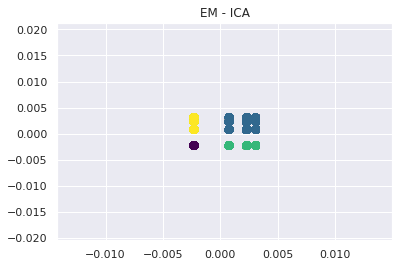

In [66]:
plt.scatter(X_ica[:, 0], X_ica[:, 1], c=yhat_ica, s=50, cmap='viridis')
plt.title('EM - ICA')

# Neural Network on Cluster Output

In [78]:
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve,roc_auc_score, precision_score, recall_score,f1_score
from sklearn.metrics import make_scorer, accuracy_score
import time

Using TensorFlow backend.


In [68]:
yhat_prob_pca


array([[8.31147971e-25, 1.00000000e+00, 1.03130789e-12, 1.03130789e-12],
       [8.31147971e-25, 1.00000000e+00, 1.03130789e-12, 1.03130789e-12],
       [8.31147971e-25, 1.00000000e+00, 1.03130789e-12, 1.03130789e-12],
       ...,
       [9.99998721e-01, 3.17208527e-13, 6.39476725e-07, 6.39476725e-07],
       [9.99998721e-01, 3.17208527e-13, 6.39476725e-07, 6.39476725e-07],
       [9.99998721e-01, 3.17208527e-13, 6.39476725e-07, 6.39476725e-07]])

In [80]:
yhat_pca

array([1, 1, 1, ..., 0, 0, 0])

In [81]:
X=np.array(yhat_prob_pca)
y=np.array(yhat_pca)

In [82]:
#Train Test Validation Split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [83]:


y_train_enc = to_categorical(y_train)
y_test_enc = to_categorical(y_test)
print(y_train_enc.shape)



(193280, 4)


In [88]:


# define the model
#get number of columns in training data
n_cols=X_train.shape[1]

# define model 2 layers
model = Sequential()
model.add(Dense(100, input_dim=n_cols, activation='relu'))
model.add(Dense(50,  activation='relu'))
model.add(Dense(4, activation='sigmoid'))
# compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [89]:
epochs= 200
start=time.time()
#fit model
hist=model.fit(X_train, y_train_enc,  validation_split=0.2, epochs=epochs,batch_size=100, verbose=1)
end=time.time()
print("Elapsed Time: ", end-start)

Train on 154624 samples, validate on 38656 samples
Epoch 1/200
154624/154624 [==============================] - 3s 18us/step - loss: 0.0259 - accuracy: 0.9940 - val_loss: 8.4683e-05 - val_accuracy: 1.0000
Epoch 2/200
154624/154624 [==============================] - 2s 15us/step - loss: 3.7813e-05 - accuracy: 1.0000 - val_loss: 1.5068e-05 - val_accuracy: 1.0000
Epoch 3/200
154624/154624 [==============================] - 2s 15us/step - loss: 7.9908e-06 - accuracy: 1.0000 - val_loss: 3.7824e-06 - val_accuracy: 1.0000
Epoch 4/200
154624/154624 [==============================] - 2s 15us/step - loss: 2.2423e-06 - accuracy: 1.0000 - val_loss: 1.1037e-06 - val_accuracy: 1.0000
Epoch 5/200
154624/154624 [==============================] - 2s 15us/step - loss: 5.7402e-07 - accuracy: 1.0000 - val_loss: 3.0980e-07 - val_accuracy: 1.0000
Epoch 6/200
154624/154624 [==============================] - 2s 16us/step - loss: 2.0081e-07 - accuracy: 1.0000 - val_loss: 1.2497e-07 - val_accuracy: 1.0000
Epoch

154624/154624 [==============================] - 2s 15us/step - loss: 1.1170e-08 - accuracy: 1.0000 - val_loss: 1.1220e-08 - val_accuracy: 1.0000
Epoch 53/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0907e-08 - accuracy: 1.0000 - val_loss: 1.0992e-08 - val_accuracy: 1.0000
Epoch 54/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.1048e-08 - accuracy: 1.0000 - val_loss: 1.1115e-08 - val_accuracy: 1.0000
Epoch 55/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.1000e-08 - accuracy: 1.0000 - val_loss: 1.1038e-08 - val_accuracy: 1.0000
Epoch 56/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0724e-08 - accuracy: 1.0000 - val_loss: 1.0799e-08 - val_accuracy: 1.0000
Epoch 57/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0833e-08 - accuracy: 1.0000 - val_loss: 1.0915e-08 - val_accuracy: 1.0000
Epoch 58/200
154624/154624 [==============================]

154624/154624 [==============================] - 2s 15us/step - loss: 1.0913e-08 - accuracy: 1.0000 - val_loss: 1.0955e-08 - val_accuracy: 1.0000
Epoch 104/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0972e-08 - accuracy: 1.0000 - val_loss: 1.1002e-08 - val_accuracy: 1.0000
Epoch 105/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0925e-08 - accuracy: 1.0000 - val_loss: 1.0968e-08 - val_accuracy: 1.0000
Epoch 106/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.1012e-08 - accuracy: 1.0000 - val_loss: 1.1048e-08 - val_accuracy: 1.0000
Epoch 107/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.1026e-08 - accuracy: 1.0000 - val_loss: 1.1050e-08 - val_accuracy: 1.0000
Epoch 108/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0929e-08 - accuracy: 1.0000 - val_loss: 1.0971e-08 - val_accuracy: 1.0000
Epoch 109/200
154624/154624 [=========================

154624/154624 [==============================] - 2s 15us/step - loss: 1.1058e-08 - accuracy: 1.0000 - val_loss: 1.1086e-08 - val_accuracy: 1.0000
Epoch 155/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.1114e-08 - accuracy: 1.0000 - val_loss: 1.1122e-08 - val_accuracy: 1.0000
Epoch 156/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0977e-08 - accuracy: 1.0000 - val_loss: 1.0988e-08 - val_accuracy: 1.0000
Epoch 157/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0893e-08 - accuracy: 1.0000 - val_loss: 1.0915e-08 - val_accuracy: 1.0000
Epoch 158/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0903e-08 - accuracy: 1.0000 - val_loss: 1.0927e-08 - val_accuracy: 1.0000
Epoch 159/200
154624/154624 [==============================] - 2s 15us/step - loss: 1.0928e-08 - accuracy: 1.0000 - val_loss: 1.0955e-08 - val_accuracy: 1.0000
Epoch 160/200
154624/154624 [=========================

In [90]:
# predict probabilities for test set
yhat_probs = model.predict(X_test, verbose=0)
# predict crisp classes for test set
yhat_classes = model.predict_classes(X_test, verbose=1)

48320/48320 [==============================] - 1s 11us/step


In [92]:
# accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test, yhat_classes)
print('Accuracy: %f' % accuracy)
# precision tp / (tp + fp)
#precision = precision_score(y_test, yhat_classes)
#print('Precision: %f' % precision)
# recall: tp / (tp + fn)
#recall = recall_score(y_test, yhat_classes)
#print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
#f1 = f1_score(y_test, yhat_classes)
#print('F1 score: %f' % f1)

Accuracy: 1.000000


In [93]:


# ROC AUC
auc = roc_auc_score(y_test_enc, yhat_probs)
print('ROC AUC: %f' % auc)



ROC AUC: 1.000000


In [94]:


# confusion matrix
matrix = confusion_matrix(y_test, yhat_classes)
print(matrix)



[[ 8416     0     0     0]
 [    0 16705     0     0]
 [    0     0 11747     0]
 [    0     0     0 11452]]


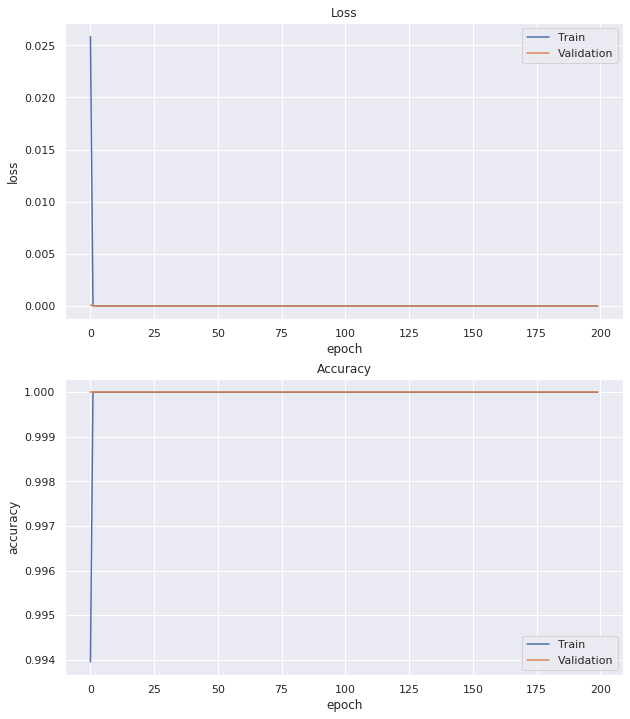

In [95]:


# plot loss during training
plt.figure(1, figsize=(10,12))
plt.subplot(211)
plt.title('Loss')
plt.plot(hist.history['loss'], label='Train')
plt.plot(hist.history['val_loss'], label='Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
# plot accuracy during training
plt.subplot(212)
plt.title('Accuracy')
plt.plot(hist.history['accuracy'], label='Train')
plt.plot(hist.history['val_accuracy'], label='Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()

